In [3]:
import pandas as pd

In [4]:
df=pd.read_csv('./data/Weekly.csv')

In [5]:
df=df.drop('Unnamed: 0',axis=1)

In [6]:
df.Direction = df.Direction.map({'Down':0,'Up':1})

In [7]:
df

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
0,1990,0.816,1.572,-3.936,-0.229,-3.484,0.154976,-0.270,0
1,1990,-0.270,0.816,1.572,-3.936,-0.229,0.148574,-2.576,0
2,1990,-2.576,-0.270,0.816,1.572,-3.936,0.159837,3.514,1
3,1990,3.514,-2.576,-0.270,0.816,1.572,0.161630,0.712,1
4,1990,0.712,3.514,-2.576,-0.270,0.816,0.153728,1.178,1
...,...,...,...,...,...,...,...,...,...
1084,2010,-0.861,0.043,-2.173,3.599,0.015,3.205160,2.969,1
1085,2010,2.969,-0.861,0.043,-2.173,3.599,4.242568,1.281,1
1086,2010,1.281,2.969,-0.861,0.043,-2.173,4.835082,0.283,1
1087,2010,0.283,1.281,2.969,-0.861,0.043,4.454044,1.034,1


In [8]:
sum(df["Direction"])/1089

0.5555555555555556

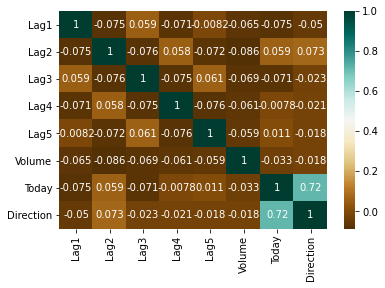

In [9]:
import seaborn as sns
sns.heatmap(df[["Lag1","Lag2","Lag3","Lag4","Lag5","Volume","Today","Direction"]].corr(),cmap="BrBG",annot=True)


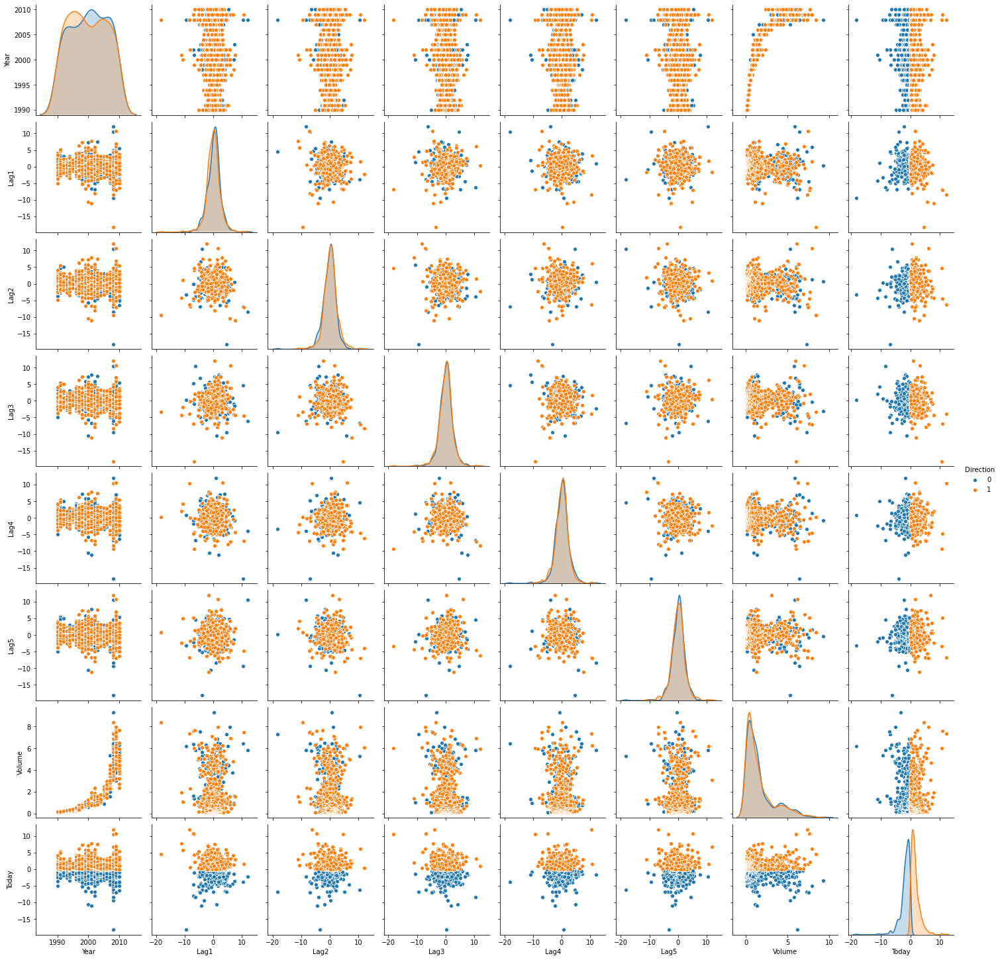

In [9]:
sns.pairplot(df, hue='Direction')

In [10]:
df_down=df.loc[df.Direction==0]
df_up=df.loc[df.Direction==1]

In [11]:
df_down.cov()

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
Year,36.022689,-0.493193,-1.387512,-0.270427,-0.432056,-1.328795,8.535974,-2.048244,0.0
Lag1,-0.493193,5.357725,-0.714082,-0.167751,-0.526982,0.270771,-0.108448,0.738652,0.0
Lag2,-1.387512,-0.714082,5.252452,-0.195404,0.642406,-0.305513,-0.659410,0.617544,0.0
Lag3,-0.270427,-0.167751,-0.195404,5.205719,-1.106823,0.377401,-0.206046,0.256316,0.0
Lag4,-0.432056,-0.526982,0.642406,-1.106823,5.969982,-0.267604,-0.188688,0.351926,0.0
Lag5,-1.328795,0.270771,-0.305513,0.377401,-0.267604,5.624287,-0.575976,0.661464,0.0
Volume,8.535974,-0.108448,-0.659410,-0.206046,-0.188688,-0.575976,2.886741,-0.862754,0.0
Today,-2.048244,0.738652,0.617544,0.256316,0.351926,0.661464,-0.862754,3.096609,0.0
Direction,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [12]:
df_up.cov()

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
Year,36.728384,-0.461145,0.295510,-0.566562,-0.464658,0.269071,8.599421,1.215915,0.0
Lag1,-0.461145,5.697845,-0.141741,0.710314,-0.303132,-0.307674,-0.384840,-0.981225,0.0
Lag2,0.295510,-0.141741,5.756206,-0.586006,0.086369,-0.469360,-0.075746,-0.425541,0.0
Lag3,-0.566562,0.710314,-0.586006,5.868805,0.123696,0.303038,-0.335094,-0.753616,0.0
Lag4,-0.464658,-0.303132,0.086369,0.123696,5.256781,-0.549478,-0.289727,-0.211577,0.0
Lag5,0.269071,-0.307674,-0.469360,0.303038,-0.549478,5.542700,0.038440,-0.287406,0.0
Volume,8.599421,-0.384840,-0.075746,-0.335094,-0.289727,0.038440,2.814208,0.545837,0.0
Today,1.215915,-0.981225,-0.425541,-0.753616,-0.211577,-0.287406,0.545837,2.342537,0.0
Direction,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


NameError: name 'plt' is not defined

In [14]:
df_b=df[["Lag1","Lag2","Lag3","Lag4","Lag5","Volume","Direction"]]
df_b_p=df[["Lag1","Lag2","Lag3","Lag4","Lag5","Volume"]]
df_y=df.Direction

In [15]:
df_b.to_csv('./data/df_B.csv',index=False)

In [16]:
#df_b=df.drop('Year','Today',axis=1)

In [17]:
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm

In [18]:
model = LogisticRegression()
model.fit(df_b_p, df_y)
pred_LR=model.predict(df_b_p)

In [19]:
model.score(df_b_p, df_y)

0.5610651974288338

In [20]:
Logistic_md= sm.Logit(df_y,df_b_p)
Logistic_result=Logistic_md.fit(method='newton')
#Logistic_result=Logistic_md.fit()
Logistic_result.params


Optimization terminated successfully.
         Current function value: 0.686896
         Iterations 4


Lag1     -0.032730
Lag2      0.068196
Lag3     -0.008099
Lag4     -0.019420
Lag5     -0.006856
Volume    0.056925
dtype: float64

In [21]:
Logistic_result.summary2()


<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
================================================================
Model:              Logit            Pseudo R-squared: 0.000    
Dependent Variable: Direction        AIC:              1508.0601
Date:               2021-01-07 10:01 BIC:              1538.0182
No. Observations:   1089             Log-Likelihood:   -748.03  
Df Model:           5                LL-Null:          -748.10  
Df Residuals:       1083             LLR p-value:      0.99961  
Converged:          1.0000           Scale:            1.0000   
No. Iterations:     4.0000                                      
------------------------------------------------------------------
           Coef.    Std.Err.      z      P>|z|     [0.025   0.975]
------------------------------------------------------------------
Lag1      -0.0327     0.0262   -1.2503   0.2112   -0.0840   0.0186
Lag2       0.0682     0.0267    2.5556   0.0106    0.0159   0.1205
Lag3      -0.0081     0.0264   -0.3062   0.7594   -0.0599   0.0437
Lag4      -0.0194     0.0262   -0.7403   0.4591   -0.0708   0.0320
Lag5      -0.0069     0.0262   -0.2614   0.7938   -0.0583   0.0446
Volume     0.0569     0.0268    2.1247   0.0336    0.0044   0.1094
================================================================

"""

In [22]:
from sklearn.metrics import confusion_matrix
test_conf=confusion_matrix(df_y,pred_LR)

In [23]:
test_conf

#Confusion matrix for the Logistic Regression model 

array([[ 54, 430],
       [ 48, 557]], dtype=int64)

In [24]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(df_y, pred_LR, pos_label=1)
metrics.auc(fpr, tpr)

0.5161157024793388

In [25]:
557 / (430+ 557 )

0.5643363728470111

In [26]:
df_d=df.loc[df.Year>=1990]
df_d=df_d.loc[df.Year<2009]
df_d

df_d[[]]

""
0
1
2
3
4
...
980
981
982
983


In [27]:
df_d_ex=df.loc[df.Year>2008]
df_d[['Lag2','Direction']].to_csv('./data/Train_Lag2.csv',index=False)


In [28]:
df_d_ex[['Lag2','Direction']].to_csv('./data/Test_Lag2.csv',index=False)


In [31]:

Logistic_md_2= sm.Logit(df_d[['Direction']],df_d[['Lag2']])
Logistic_result_2=Logistic_md_2.fit(method='newton')
#Logistic_result=Logistic_md.fit()
Logistic_result_2.summary()

Optimization terminated successfully.
         Current function value: 0.690654
         Iterations 4


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              Direction   No. Observations:                  985
Model:                          Logit   Df Residuals:                      984
Method:                           MLE   Df Model:                            0
Date:                Thu, 07 Jan 2021   Pseudo R-squ.:               -0.004340
Time:                        09:56:15   Log-Likelihood:                -680.29
converged:                       True   LL-Null:                       -677.35
Covariance Type:            nonrobust   LLR p-value:                       nan
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Lag2           0.0629      0.029      2.192      0.028       0.007       0.119
==============================================================================
"""

In [32]:
model_d = LogisticRegression()
model_d.fit(df_d[['Lag2']], df_d[['Direction']])
pred_LR_d=model_d.predict(df_d_ex[['Lag2']])
test_conf_RL=confusion_matrix(df_d_ex.Direction,pred_LR_d)
test_conf_RL

array([[ 9, 34],
       [ 5, 56]], dtype=int64)

In [33]:
fpr, tpr, thresholds = metrics.roc_curve(df_d_ex.Direction, pred_LR_d, pos_label=1)
metrics.auc(fpr, tpr)

0.5636675562333207

In [34]:
(test_conf_RL[0][0]+test_conf_RL[1][1])/(test_conf_RL[0][0]+test_conf_RL[0][1]+test_conf_RL[1][0]+test_conf_RL[1][1])

0.625

In [35]:
(test_conf_RL[0][0])/(test_conf_RL[0][0]+test_conf_RL[0][1])

0.20930232558139536

In [36]:
(test_conf_RL[1][1])/(test_conf_RL[1][0]+test_conf_RL[1][1])

0.9180327868852459

In [37]:
(test_conf_RL[0][0])/(test_conf_RL[0][0]+test_conf_RL[1][0])

0.6428571428571429

In [38]:
(test_conf_RL[1][1])/(test_conf_RL[0][1]+test_conf_RL[1][1])

0.6222222222222222

In [39]:
(test_conf_RL[0][0]+test_conf_RL[1][1])/(test_conf_RL[0][0]+test_conf_RL[0][1]+test_conf_RL[1][0]+test_conf_RL[1][1])
(test_conf_RL[0][0])/(test_conf_RL[0][0]+test_conf_RL[0][1])
(test_conf_RL[1][1])/(test_conf_RL[1][0]+test_conf_RL[1][1])
(test_conf_RL[0][0])/(test_conf_RL[0][0]+test_conf_RL[1][0])
(test_conf_RL[1][1])/(test_conf_RL[0][1]+test_conf_RL[1][1])

0.6222222222222222

In [40]:



Logistic_md_2= sm.Logit(df_d[['Direction']],df_d[['Lag2']])
Logistic_result_2=Logistic_md_2.fit(method='newton')
#Logistic_result=Logistic_md.fit()
Logistic_result_2.summary()

Optimization terminated successfully.
         Current function value: 0.690654
         Iterations 4


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              Direction   No. Observations:                  985
Model:                          Logit   Df Residuals:                      984
Method:                           MLE   Df Model:                            0
Date:                Thu, 07 Jan 2021   Pseudo R-squ.:               -0.004340
Time:                        09:56:21   Log-Likelihood:                -680.29
converged:                       True   LL-Null:                       -677.35
Covariance Type:            nonrobust   LLR p-value:                       nan
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Lag2           0.0629      0.029      2.192      0.028       0.007       0.119
==============================================================================
"""

In [41]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
model_lda_e = LinearDiscriminantAnalysis()
model_lda_e.fit(df_d[['Lag2']], df_d[['Direction']])
pred_LDA_e=model_lda_e.predict(df_d_ex[['Lag2']])
test_conf_LDA=confusion_matrix(df_d_ex.Direction,pred_LDA_e)
test_conf_LDA


array([[ 9, 34],
       [ 5, 56]], dtype=int64)

In [42]:
fpr, tpr, thresholds = metrics.roc_curve(df_d_ex.Direction, pred_LDA_e, pos_label=1)
metrics.auc(fpr, tpr)

0.5636675562333207

In [43]:
print((test_conf_LDA[0][0]+test_conf_LDA[1][1])/(test_conf_LDA[0][0]+test_conf_LDA[0][1]+test_conf_LDA[1][0]+test_conf_LDA[1][1]))
print((test_conf_LDA[0][0])/(test_conf_LDA[0][0]+test_conf_LDA[0][1]))
print((test_conf_LDA[1][1])/(test_conf_LDA[1][0]+test_conf_LDA[1][1]))
print((test_conf_LDA[0][0])/(test_conf_LDA[0][0]+test_conf_LDA[1][0]))
print((test_conf_LDA[1][1])/(test_conf_LDA[0][1]+test_conf_LDA[1][1]))

0.625
0.20930232558139536
0.9180327868852459
0.6428571428571429
0.6222222222222222


In [44]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=1)    
knn.fit(df_d[['Lag2']], df_d[['Direction']])
pred_knn_f = knn.predict(df_d_ex[['Lag2']])
test_conf_KNN=confusion_matrix(df_d_ex.Direction,pred_knn_f)
test_conf_KNN

array([[21, 22],
       [31, 30]], dtype=int64)

In [45]:
fpr, tpr, thresholds = metrics.roc_curve(df_d_ex.Direction, pred_knn_f, pos_label=1)
metrics.auc(fpr, tpr)

0.49008768585589024

In [46]:
print((test_conf_KNN[0][0]+test_conf_KNN[1][1])/(test_conf_KNN[0][0]+test_conf_KNN[0][1]+test_conf_KNN[1][0]+test_conf_LDA[1][1]))
print((test_conf_KNN[0][0])/(test_conf_KNN[0][0]+test_conf_KNN[0][1]))
print((test_conf_KNN[1][1])/(test_conf_KNN[1][0]+test_conf_KNN[1][1]))
print((test_conf_KNN[0][0])/(test_conf_KNN[0][0]+test_conf_KNN[1][0]))
print((test_conf_KNN[1][1])/(test_conf_KNN[0][1]+test_conf_KNN[1][1]))

0.3923076923076923
0.4883720930232558
0.4918032786885246
0.40384615384615385
0.5769230769230769


In [47]:
model_d = LogisticRegression()
model_d.fit(df_d[['Lag2']], df_d[['Direction']])
pred_LR_d=model_d.predict(df_d_ex[['Lag2']])
test_conf_RL=confusion_matrix(df_d_ex.Direction,pred_LR_d)
test_conf_RL

array([[ 9, 34],
       [ 5, 56]], dtype=int64)

0.5636675562333207

In [48]:
import seaborn as sns
df_d.corr()

#It doesn’t look like there’s any dangerously high multicollinearity. Next we’ll look at variance inflation factors.
#https://medium.com/@kylecaron/introduction-to-linear-regression-part-3-polynomial-regression-interaction-terms-and-feature-c70293d2038d

,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today,Direction
Year,1.000000,-0.062350,-0.061578,-0.058062,-0.058800,-0.054142,0.821949,-0.057008,-0.040280
Lag1,-0.062350,1.000000,-0.087810,0.070184,-0.065834,0.008840,-0.119666,-0.089998,-0.065475
Lag2,-0.061578,-0.087810,1.000000,-0.088553,0.070198,-0.067673,-0.152012,0.071587,0.064911
Lag3,-0.058062,0.070184,-0.088553,1.000000,-0.088180,0.073291,-0.131249,-0.065122,-0.018993
Lag4,-0.058800,-0.065834,0.070198,-0.088180,1.000000,-0.087729,-0.119411,0.006208,-0.014678
Lag5,-0.054142,0.008840,-0.067673,0.073291,-0.087729,1.000000,-0.114505,-0.007118,-0.036883
Volume,0.821949,-0.119666,-0.152012,-0.131249,-0.119411,-0.114505,1.000000,-0.076343,-0.043668
Today,-0.057008,-0.089998,0.071587,-0.065122,0.006208,-0.007118,-0.076343,1.000000,0.718406
Direction,-0.040280,-0.065475,0.064911,-0.018993,-0.014678,-0.036883,-0.043668,0.718406,1.000000


In [49]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Factor"]=[variance_inflation_factor(df_d.values,i) for i in range(df_d.shape[1]-1)]
vif["VIF Factor"]


0    4.485517
1    1.046672
2    1.061259
3    1.053790
4    1.046934
5    1.038700
6    2.142172
7    2.107479
Name: VIF Factor, dtype: float64

In [52]:
scaler = StandardScaler()
PN = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
scaled_X = scaler.fit_transform( PN.fit_transform(df_d[['Lag1', 'Lag2']]) )
X_ad = pd.DataFrame( sm.add_constant(scaled_X) , columns = ['const', 'TV', 'radio', 'TVxradio'])
res2 = sm.OLS(y_ad, X_ad).fit()
res2.summary()

NameError: name 'StandardScaler' is not defined

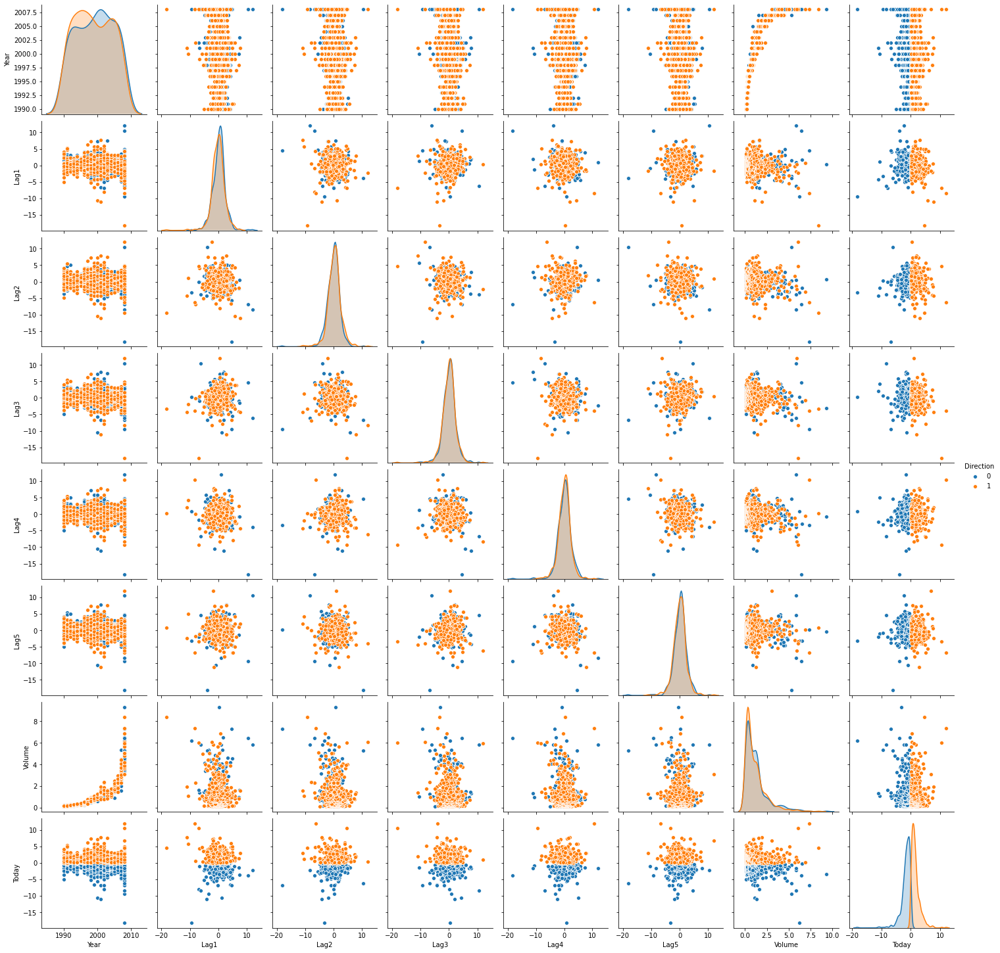

In [51]:
sns.pairplot(df_d, hue='Direction')